
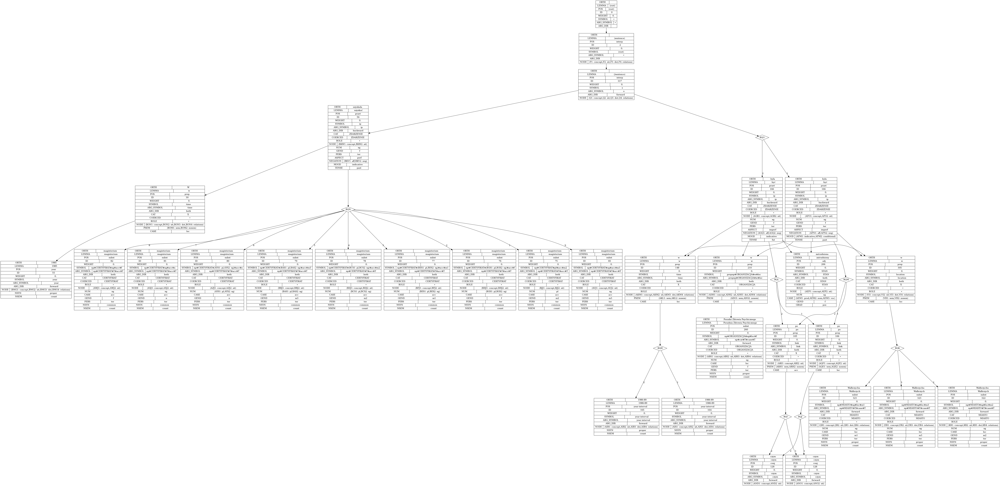
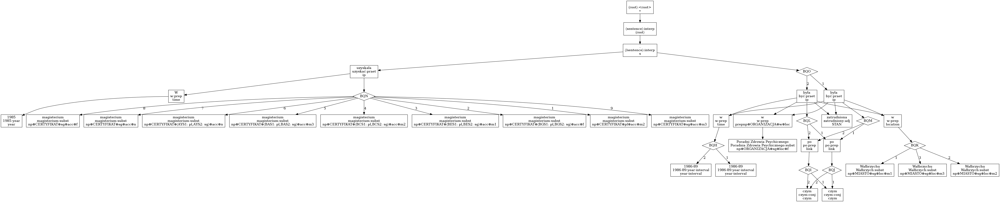
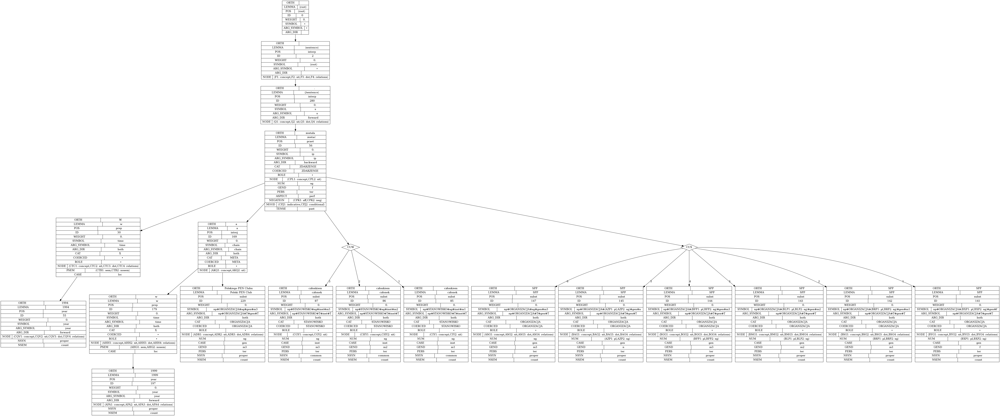
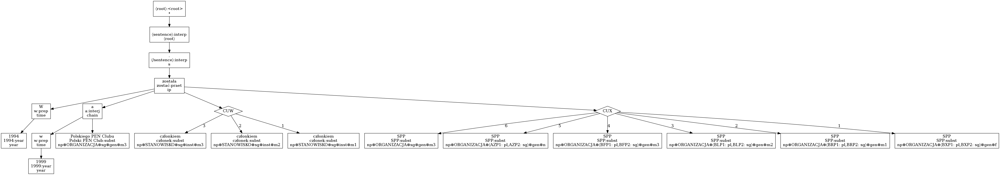
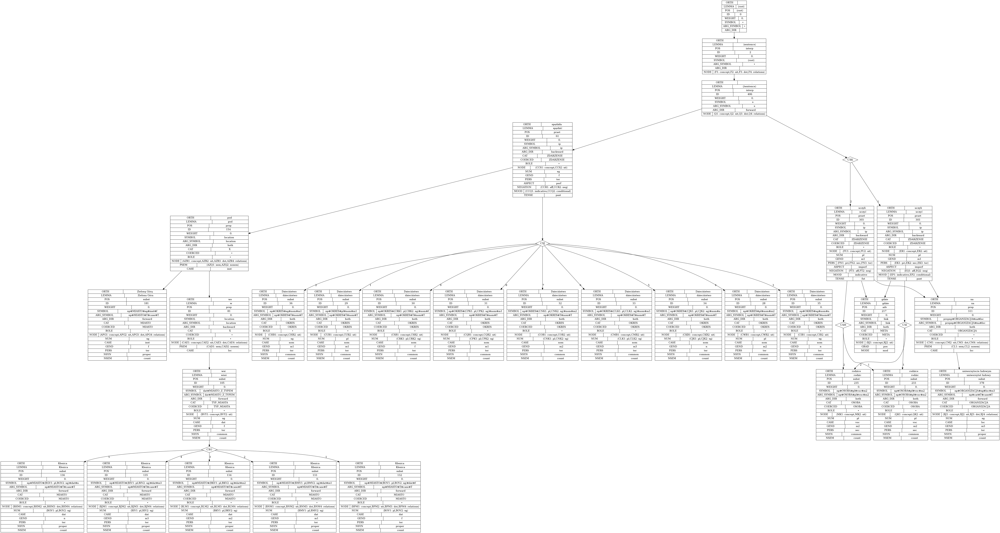
...
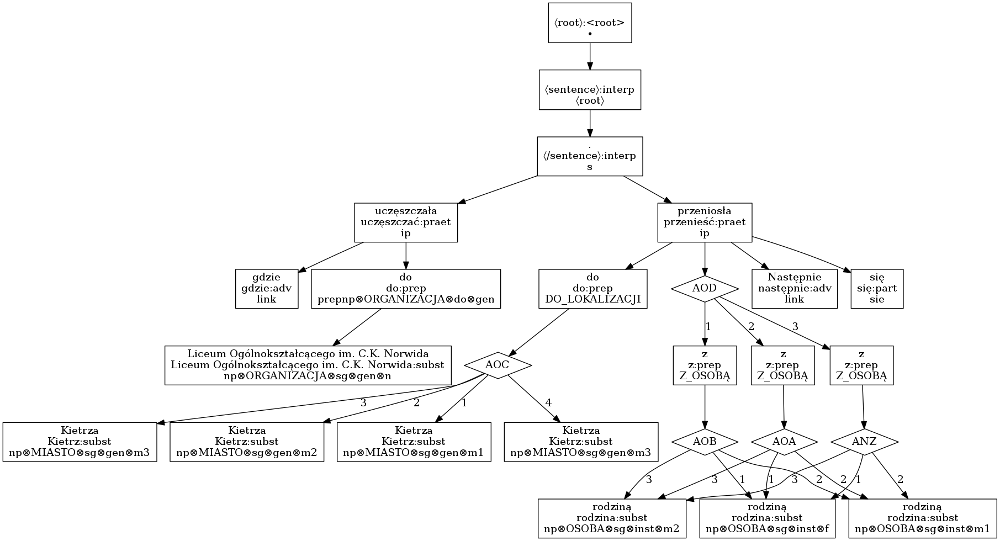
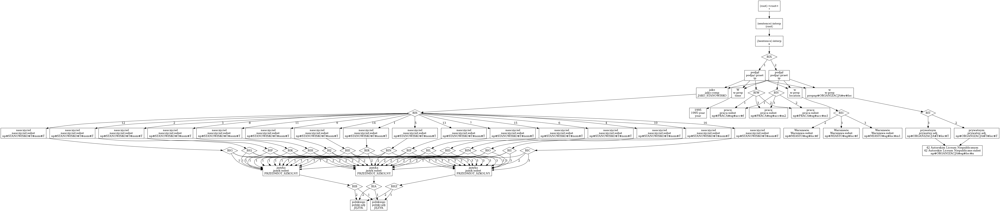
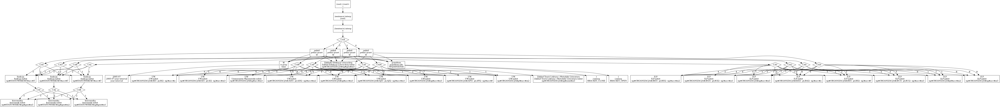
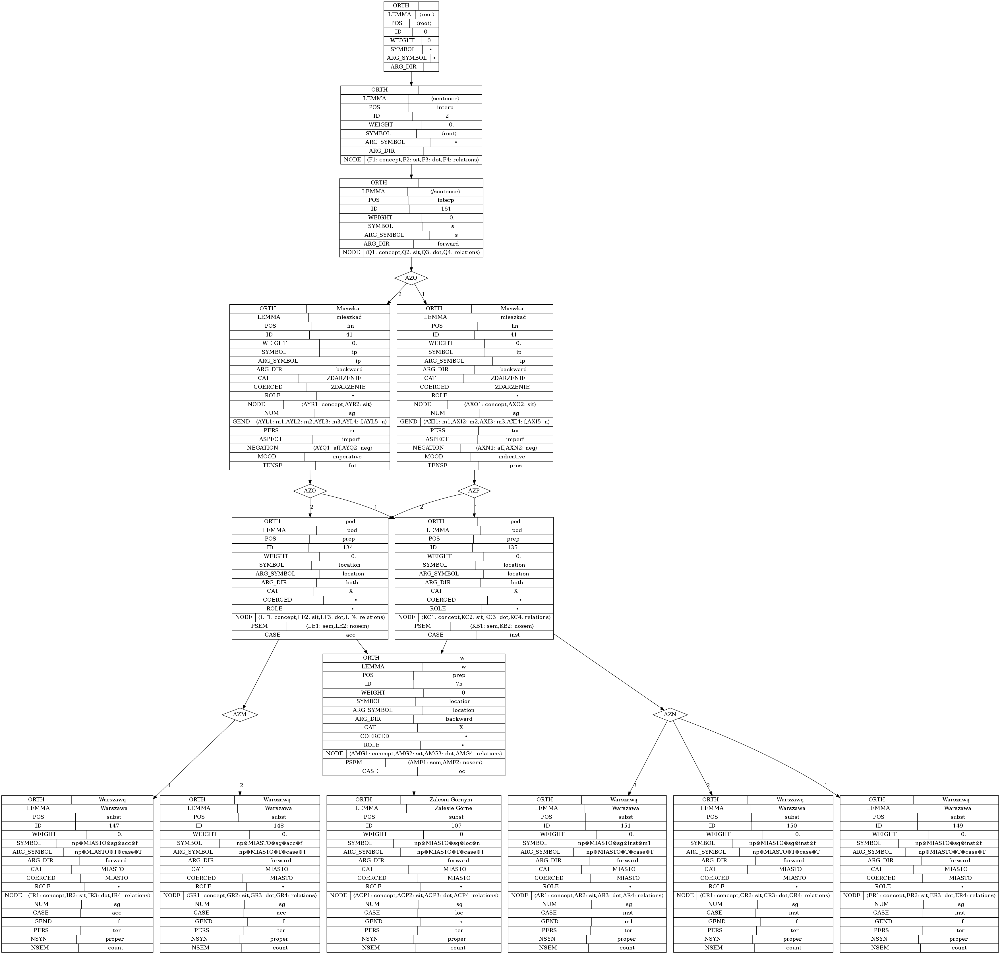
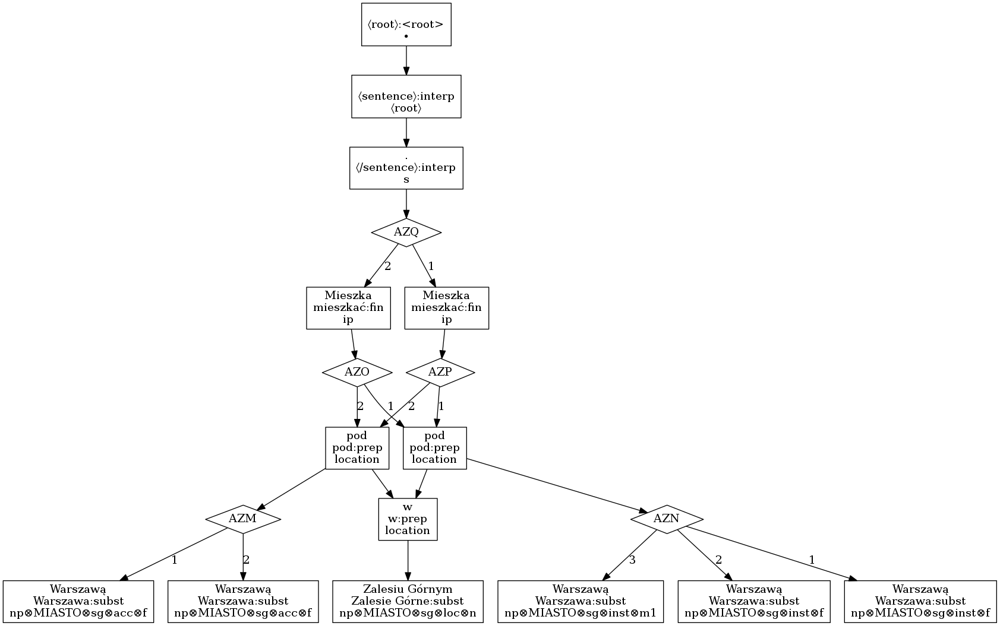

In [3]:
#!pip install eniam
#
# Eniam python library requires Docker installation where "docker" command is callable from
# the terminal.
#
#
from eniam import *

eniam_instance = Eniam(
[
    'MIASTO', 'ORGANIZACJA', 'CERTYFIKAT', 'KIERUNEK_STUDIÓW', 'STAN', 'czym', 'STANOWISKO', 'OKRES', 'OSOBA',
    'chain', 'MIASTO_Z_TYPEM', 'JAKO_STANOWISKO', 'UTWÓR', 'TYTUŁ', 'DO_LOKALIZACJI', 'sie', 'Z_OSOBĄ', 'PRACA',
    'PRZEDMIOT_SZKOLNY', 'JĘZYK', 'META_FUNKCJA', 'BRACKET_OPEN', 'BRACKET_CLOSE', 'WYJAŚNIENIE'
],
{
    rule(pos=year_interval):              year_interval,
    rule(pos=year):                       year,
    rule(lemma='przy',pos=prep):        
        ((np*gram('ORGANIZACJA')*T*gen*T)>(np*gram('OSOBA')*T*T*T))<(np*gram('ORGANIZACJA')*T*gen*T),
    rule(lemma='w',pos=prep,case=loc):    time>(year_interval+year),
    rule(lemma='wieś',pos=subst,case=dat): dat*gram('MIASTO_Z_TYPEM')>np*gram('MIASTO')*T*case*T,
    rule(lemma='w',pos=prep,case=loc):    gram('location/np')*gram('MIASTO')*T*case*T,
    rule(lemma='w',pos=prep,case=loc):    gram('location')>dat*gram('MIASTO_Z_TYPEM'),
    rule(lemma='prywatny',pos=adj): (np*gram('ORGANIZACJA')*T*loc*T)>(np*gram('ORGANIZACJA')*T*loc*T),
    rule(lemma='pod',pos=prep):    (gram('location')<gram('location'))>np*gram('MIASTO')*T*case*T,
    rule(lemma='do',pos=prep): gram('DO_LOKALIZACJI')>(dat*gram('MIASTO_Z_TYPEM')),
    rule(lemma='do',pos=prep): gram('DO_LOKALIZACJI')>(np*gram('MIASTO')*T*gen*T),
    rule(lemma='nauczyciel', pos=subst): (np*gram('STANOWISKO')*T*nom*T)>gram('PRZEDMIOT_SZKOLNY'),
    rule(lemma='polski', pos=adj): gram('JĘZYK'),
    rule(lemma='funkcja', pos=subst, case=acc): (np*gram('STANOWISKO')*T*acc*T)>(np*gram('STANOWISKO')*T*gen*T),
    rule(lemma='język', pos=subst): gram('PRZEDMIOT_SZKOLNY')>gram('JĘZYK'),
    rule(lemma='z',pos=prep): gram('Z_OSOBĄ')>np*gram('OSOBA')*T*inst*T,
    rule(pos=prep):                       quant(prepnp*cat*lemma*gram('case/np')*cat*T*case*T, cat=gram('0')),
    rule(pos=subst):                      np*cat*number*case*gender,
    rule(lemma='następnie',pos=adv):      link,
    rule(lemma='na',pos=prep): gram('location')>gram('ORGANIZACJA'),
    rule(lemma='gdzie',pos=adv):      link,
    rule(lemma='a',pos=interj):           link,
    rule(lemma='(',pos=interp): gram('BRACKET_OPEN'),
    rule(lemma=')',pos=interp): gram('BRACKET_CLOSE'),
    rule(lemma='a',pos=interj):       
        gram('chain')[ time | np*gram('ORGANIZACJA')*T*gen*T ],
    rule(lemma='po', pos=prep):           link>gram('czym'),
    rule(lemma='czym', pos=conj):         gram('czym'),
    rule(lemma='jako', pos=comp): gram('JAKO_STANOWISKO')>(np*gram('STANOWISKO')*T*nom*T),
    rule(lemma='utwór',pos=subst,case=inst): np*gram('TYTUŁ')*T*inst*T>(np*gram('TYTUŁ')*T*nom*T),
    rule(lemma='się',pos=part): gram('sie'),
    rule(lemma='pełnić', pos=praet):
        ip[time | np*gram('STANOWISKO')*T*acc*T | (np*gram('ORGANIZACJA')*T*gen*T) | (np*gram('ORGANIZACJA')*T*acc*T) | (np*gram('ORGANIZACJA')*T*acc*T) | optional(gram('WYJAŚNIENIE')) ],
    rule(lemma='przenieść', pos=praet):
        ip[link | (one+gram('sie')) | gram('DO_LOKALIZACJI') | gram('Z_OSOBĄ')],
    rule(lemma='podjąć',pos=praet):
        ip[ time | (np*gram('PRACA')*T*acc*T) | gram('JAKO_STANOWISKO') | (prepnp*gram('ORGANIZACJA')*gram('w')*loc) | location ],
    rule(lemma='debiutować', pos=praet):
        ip[ time | gram('JAKO_STANOWISKO') | (np*gram('TYTUŁ')*T*inst*T) ],
    rule(lemma='przeprowadzić',pos=praet):
        ip[ (one+gram('sie')) | time | gram('DO_LOKALIZACJI') ],
    rule(lemma='uczyć', pos=praet):
        ip[(one+link) | np*gram('OSOBA')*gram('pl')*voc*gram('m2') | prepnp*gram('ORGANIZACJA')*gram('na')*loc],
    rule(lemma='być', pos=praet, person=ter):
        ip[(one+link) | gram('STAN') | time | prepnp*gram('ORGANIZACJA')*gram('w')*loc | location],
    rule(lemma='zostać', pos=praet, person=ter):
        ip[ time | (np*gram('STANOWISKO')*T*inst*T) | (np*gram('ORGANIZACJA')*T*gen*T) | optional('chain')],
    rule(lemma='zatrudniony', pos=adj): gram('STAN'),
    rule(lemma='uczęszczać',pos=praet,person=ter,mood=indicative,tense=past):
        ip[ optional(one+link) | optional(time) | prepnp*gram('ORGANIZACJA')*gram('do')*gen | optional(location) ],
    rule(lemma='uzyskać',pos=praet,person=ter,mood=indicative,tense=past):
        ip[ time | np*gram('CERTYFIKAT')*T*acc*T ],
    rule(lemma='studiować',pos=praet,person=ter,mood=indicative,tense=past):
        ip[ (one+link) | np*gram('KIERUNEK_STUDIÓW')*T*acc*T | prepnp*gram('ORGANIZACJA')*na*loc ],
    rule(lemma='spędzić', pos=praet, person=ter):
        ip[ np*gram('OKRES')*T*nom*T | location ],
    rule(lemma='mieszkać', pos=fin):
        ip[ location ],
    rule(lemma='przedtem',pos=adv): ((gram('WYJAŚNIENIE')<gram('BRACKET_OPEN'))>gram('BRACKET_CLOSE'))>(np*gram('ORGANIZACJA')*T*nom*T),
    root_rule():                          s % (ip+cp*vint*T+np*sg*voc*T*T+interj),
},
[
    'ZDARZENIE',
    'OSOBA', 'KIERUNEK_STUDIÓW', 'CERTYFIKAT', 'CZAS', 'STAN', 'UTWÓR', 'TYTUŁ',
    'PRACA', 'OKRES', 'NUMER', 'META', 'AUTOR', 'STANOWISKO', 'TYP_MIASTA', 'JĘZYK', 'PRZEDMIOT_SZKOLNY', 'META_FUNKCJA'
],
{
    valence_rule('zatrudniony', 'adj'): 'STAN',
    valence_rule('urodzić', 'verb'): 'ZDARZENIE',
    valence_rule('syn', 'noun'): 'OSOBA',
    valence_rule('uczęszczać', 'verb'): 'ZDARZENIE',
    valence_rule('studiować', 'verb'): 'ZDARZENIE',
    valence_rule('spędzić', 'verb'): 'ZDARZENIE',
    valence_rule('architektura', 'noun'): 'KIERUNEK_STUDIÓW',
    valence_rule('dyplom', 'noun'): 'CERTYFIKAT',
    valence_rule('magisterium', 'noun'): 'CERTYFIKAT',
    valence_rule('uzyskać', 'verb'): 'ZDARZENIE',
    valence_rule('okres', 'noun'): 'CZAS',
    valence_rule('być', 'verb'): 'ZDARZENIE',
    valence_rule('członek', 'noun'): 'STANOWISKO',
    valence_rule('zostać', 'verb'): 'ZDARZENIE',
    valence_rule('pisać', 'verb'): 'ZDARZENIE',
    valence_rule('opowiadanie', 'noun'): 'UTWÓR',
    valence_rule('opublikować', 'verb'): 'ZDARZENIE',
    valence_rule('okres', 'noun'): 'OKRES',
    valence_rule('dzieciństwo', 'noun'): 'OKRES',
    valence_rule('tytuł', 'noun'): 'TYTUŁ',
    valence_rule('praca', 'noun'): 'PRACA',
    valence_rule('rozpocząć', 'verb'): 'ZDARZENIE',
    valence_rule('dramaturg', 'noun'): 'AUTOR',
    valence_rule('dramatopisarka', 'noun'): 'STANOWISKO',
    valence_rule('utwór', 'noun'): 'UTWÓR',
    valence_rule('numer', 'noun'): 'NUMER',
    valence_rule('następnie', 'adv'): 'META',
    valence_rule('czym', 'conj'): 'META',
    valence_rule('po', 'prep'): 'META',
    valence_rule('a', 'interj'): 'META',
    valence_rule('wieś', 'noun'): 'TYP_MIASTA',
    valence_rule('rodzic', 'noun'): 'OSOBA',
    valence_rule('uczyć', 'verb'): 'ZDARZENIE',
    valence_rule('gdzie', 'adv'): 'META',
    valence_rule('miasto', 'noun'): 'TYP_MIASTA',
    valence_rule('przy', 'prep'): 'META',
    valence_rule('jako', 'comp'): 'META',
    valence_rule('do', 'prep'): 'META',
    valence_rule('z', 'prep'): 'META',
    valence_rule('debiutować', 'verb'): 'ZDARZENIE',
    valence_rule('przeprowadzić', 'verb'): 'ZDARZENIE',
    valence_rule('przenieść', 'verb'): 'ZDARZENIE',
    valence_rule('rodzina', 'noun'): 'OSOBA',
    valence_rule('podjąć', 'verb'): 'ZDARZENIE',
    valence_rule('nauczyciel', 'noun'): 'STANOWISKO',
    valence_rule('polski', 'adj'): 'JĘZYK',
    valence_rule('język', 'noun'): 'PRZEDMIOT_SZKOLNY',
    valence_rule('prywatny', 'adj'): 'META',
    valence_rule('pełnić', 'verb'): 'ZDARZENIE',
    valence_rule('funkcja', 'noun'): 'META_FUNKCJA',
    valence_rule('kierownik', 'noun'): 'STANOWISKO',
    valence_rule('przedtem', 'adv'): 'META',
    valence_rule('(', 'interp'): 'META',
    valence_rule(')', 'interp'): 'META',
    valence_rule('mieszkać', 'verb'): 'ZDARZENIE',
}).with_ne([
    ne('"Literatura na Świecie"', 'TYTUŁ'),
    ne('"Nowe Książki"', 'TYTUŁ'),
    ne('"Tygodnik Powszechny"', 'TYTUŁ'),
    ne('Skarb', 'TYTUŁ'),
    ne('42 Autorskie Liceum Niepubliczne', 'ORGANIZACJA'),
    ne('Centralny Ośrodek Doskonalenia Nauczycieli', 'ORGANIZACJA'),
    ne('Instytut Polonistyki Stosowanej', 'ORGANIZACJA'),
    ne('Kuratorium Oświaty', 'ORGANIZACJA'),
    ne('Liceum Ogólnokształcącego im. C.K. Norwida', 'ORGANIZACJA'),
    ne('Międzynarodowy Festiwal Opowiadania', 'WYDARZENIE'),
    ne('Moi przyjaciele', 'TYTUŁ'),
    ne('Nagroda Kulturalna Śląska', 'NAGRODA'),
    ne('Nagroda Miast Partnerskich Torunia i Getyngi im. S.B. Lindego', 'NAGRODA'),
    ne('Ośrodek Metodyczny', 'ORGANIZACJA'),
    ne('Polski PEN Club', 'ORGANIZACJA'),
    ne('Poradnia Zdrowia Psychicznego', 'ORGANIZACJA'),
    ne('Społeczna Rada Kultury', 'ORGANIZACJA'),
    ne('Uniwersytet Warszawski', 'ORGANIZACJA'),
    ne('Uniwersytet Środkowoeuropejski', 'ORGANIZACJA'),
    ne('Zakład Edukacji Literackiej', 'ORGANIZACJA'),
    ne('Zakład Teorii Lektury i Metodyki Literatury', 'ORGANIZACJA'),
    ne('Zielona Góra', 'MIASTO'),
    ne('Światowy Dzień Poezji', 'WYDARZENIE'),
    ne('Świąteczne zabijanie ryby', 'TYTUŁ'),
    ne('Politechnika Szczecińska', 'ORGANIZACJA'),
    ne('SPP', 'ORGANIZACJA'),
    ne('Klenica', 'MIASTO'),
    ne('Kietrz', 'MIASTO'),
    ne('uniwersytet ludowy', 'ORGANIZACJA'),
    ne('Prezydent Miasta Stołecznego Warszawy', 'OSOBA'),
    ne('UW', 'ORGANIZACJA'),
    ne('ILP', 'ORGANIZACJA'),
    ne('Zakład Teorii Lektury i Metodyki Literatury', 'ORGANIZACJA'),
    ne('Zalesie Górne', 'MIASTO'),
]).with_mwe([
    mwe('"Literaturze na Świecie"', '"Literatura na Świecie"', 'subst:sg:dat.loc:f'),
    mwe('"Nowych Książkach"', '"Nowe Książki"', 'subst:pl:loc:f'),
    mwe('"Tygodniku Powszechnym"', '"Tygodnik Powszechny"', 'subst:sg:loc:m3'),
    mwe('Skarb', 'TYTUŁ', 'subst:sg:nom.acc:m3'),
    mwe('42 Autorskim Liceum Niepublicznym', '42 Autorskie Liceum Niepubliczne', 'subst:sg:acc.loc:n:ncol'),
    mwe('Centralnym Ośrodku Doskonalenia Nauczycieli', 'Centralny Ośrodek Doskonalenia Nauczycieli', 'subst:sg:loc.voc:m3'),
    mwe('Instytutu Polonistyki Stosowanej', 'Instytut Polonistyki Stosowanej', 'subst:sg:gen:m3'),
    mwe('Kuratorium Oświaty', 'Kuratorium Oświaty', 'subst:sg:nom.acc.voc:n:ncol'),
    mwe('Liceum Ogólnokształcącego im . C . K . Norwida', 'Liceum Ogólnokształcącego im. C.K. Norwida', 'subst:sg:gen:n:ncol'),
    mwe('Międzynarodowego Festiwalu Opowiadania', 'Międzynarodowy Festiwal Opowiadania', 'subst:sg:gen.loc.voc:m3'),
    mwe('Moi przyjaciele', 'Moi przyjaciele', 'subst:pl:nom.voc:m1'),
    mwe('Nagrodę Kulturalną Śląska', 'Nagroda Kulturalna Śląska', 'subst:sg:acc:f'),
    mwe('Nagrodę Miast Partnerskich Torunia i Getyngi im . S . B . Lindego', 'Nagroda Miast Partnerskich Torunia i Getyngi im. S.B. Lindego', 'subst:sg:acc:f'),
    mwe('Ośrodku Metodycznym', 'Ośrodek Metodyczny', 'subst:sg:loc:m3'),
    mwe('Polskiego PEN Clubu', 'Polski PEN Club', 'subst:sg:gen:m3'),
    mwe('Poradni Zdrowia Psychicznego', 'Poradnia Zdrowia Psychicznego', 'subst:sg:gen.dat.loc:f'),
    mwe('Społecznej Rady Kultury', 'Społeczna Rada Kultury', 'subst:sg:gen:f'),
    mwe('Uniwersytecie Warszawskim', 'Uniwersytet Warszawski', 'subst:sg:dat.voc:m1'),
    mwe('Uniwersytetu Środkowoeuropejskiego', 'Uniwersytet Środkowoeuropejski', 'subst:sg:gen:m3'),
    mwe('Zakładu Edukacji Literackiej', 'Zakład Edukacji Literackiej', 'subst:sg:gen:m3'),
    mwe('Zakładzie Teorii Lektury i Metodyki Literatury', 'Zakład Teorii Lektury i Metodyki Literatury', 'subst:sg:loc.voc:m3'),
    mwe('Zieloną Górą', 'Zielona Góra', 'subst:sg:inst:f'),
    mwe('Światowego Dnia Poezji', 'Światowy Dzień Poezji', 'subst:sg:gen:m3'),
    mwe('Świąteczne zabijanie ryby', 'Świąteczne zabijanie ryby', 'ger:sg:nom.acc:n:imperf:aff'),
    mwe('Politechnice Szczecińskiej', 'Politechnika Szczecińska', 'subst:sg:dat.loc:f'),
    mwe('Politechniki Szczecińskiej', 'Politechnika Szczecińska', 'subst:sg:gen:f'),
    mwe('SPP', 'SPP', 'subst:sg:gen:m3'),
    mwe('Klenica', 'Klenica', 'subst:sg:nom:f'),
    mwe('Kietrza', 'Kietrz', 'subst:sg:gen:m3'),
    mwe('uniwersytecie ludowym', 'uniwersytet ludowy', 'subst:sg:loc:m3'),
    mwe('Prezydent Miasta Stołecznego Warszawy', 'Prezydent Miasta Stołecznego Warszawy', 'subst:sg:nom:m1'),
    mwe('UW', 'UW', 'subst:sg:acc:m3'),
    mwe('ILP', 'ILP', 'subst:sg:acc:m3'),
    mwe('Zakład Teorii Lektury i Metodyki Literatury', 'Zakład Teorii Lektury i Metodyki Literatury', 'subst:sg:nom:m3'),
    mwe('Zalesiu Górnym', 'Zalesie Górne', 'subst:sg:loc:n:ncol'),
])

eniam_instance.dom([
    "W 1985 uzyskała magisterium, po czym w 1986-89 była zatrudniona w Poradni Zdrowia Psychicznego w Wałbrzychu.",
    "W 1994 została członkiem SPP, a w 1999 Polskiego PEN Clubu.",
    "Dzieciństwo spędziła we wsi Klenica pod Zieloną Górą, gdzie rodzice uczyli na uniwersytecie ludowym.",
    "W 2012 został członkiem Społecznej Rady Kultury przy Prezydent Miasta Stołecznego Warszawy.",
    "W 2000 debiutowała jako dramatopisarka utworem Skarb.",
    "W 1994 przeprowadziła się do wsi Krajanów.",
    "Następnie przeniosła się z rodziną do Kietrza, gdzie uczęszczała do Liceum Ogólnokształcącego im. C.K. Norwida.",
    "W 1995 podjął pracę jako nauczyciel języka polskiego w prywatnym 42 Autorskim Liceum Niepublicznym w Warszawie.",
    "W 2005-07 pełnił funkcję kierownika Zakładu Edukacji Literackiej ILP UW (przedtem Zakład Teorii Lektury i Metodyki Literatury).",
    "Mieszka w Zalesiu Górnym pod Warszawą.",
]).show()